<a href="https://colab.research.google.com/github/tgraupmann/TF_ImageScaleUp/blob/main/Test_esrgan_tf2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image super resolution

This notebook tests the `esrgan-tf2` model. See https://tfhub.dev/captain-pool/esrgan-tf2/1

"Enhanced Super Resolution GAN... Produces x4 Super Resolution Image from images of {Height, Width} >=64. Works best on Bicubically downsampled images...."

Verdict: This model works amazingly well even without fine tuning for something ready to use right out of TensorFlow Hub!

Test: `train_data.zip` contains low resolution (940x540) images which this model scales up 4X to (3840x2160) `2K` images.

Larger images can be upscaled, but Google Collab was hitting memory limits. The alternative is to run locally.

In [2]:
# Ref: https://tfhub.dev/captain-pool/esrgan-tf2/1

import tensorflow_hub as hub
import tensorflow as tf
model = hub.load("https://tfhub.dev/captain-pool/esrgan-tf2/1")


In [3]:
# Get the data

import os
data_source = "train_data.zip"
if not os.path.exists("data_source"):
    !wget "https://raw.githubusercontent.com/tgraupmann/TF_ImageScaleUp/main/data/train_data.zip"
else:
    print("[INFO] '" + data_source + "' already exists, skipping download.")

--2022-10-10 05:41:08--  https://raw.githubusercontent.com/tgraupmann/TF_ImageScaleUp/main/data/train_data.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 43476975 (41M) [application/zip]
Saving to: ‘train_data.zip’

train_data.zip      100%[===================>]  41.46M  --.-KB/s    in 0.1s    

2022-10-10 05:41:10 (320 MB/s) - ‘train_data.zip’ saved [43476975/43476975]



In [4]:
# Get helper functions file
import os 

if not os.path.exists("helper_functions.py"):
    !wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
else:
    print("[INFO] 'helper_functions.py' already exists, skipping download.")

--2022-10-10 05:41:17--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2022-10-10 05:41:17 (79.0 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [5]:
# Import series of helper functions for the notebook (we've created/used these in previous notebooks)
from helper_functions import unzip_data

In [6]:
# Remove the old data
!rm -r -f train_data

In [7]:
# Unzip the data
unzip_data(filename="train_data.zip")

In [8]:
# Read image paths
import os
import numpy as np

# Get all training images
def get_training_images(target_folder):
  return os.listdir(target_folder)

def path_combine(path, list):
  result = []
  for i in list:
    result.append(path + i)
  return result

images = get_training_images("train_data/hd/")
hd_images = path_combine("train_data/hd/", images)
blur_images = path_combine("train_data/blur/", images)
low_images = path_combine("train_data/low/", images)

labels_training_data = np.column_stack((low_images, blur_images, hd_images)).tolist()
len(labels_training_data), labels_training_data[0]

(13,
 ['train_data/low/20220924_122236.jpg',
  'train_data/blur/20220924_122236.jpg',
  'train_data/hd/20220924_122236.jpg'])

In [9]:
# Check if image can load

# View an image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

# get a random image from the list
def get_random_image(list):
  random_image = random.sample(list, 1)
  return random_image[0]

def show_image_data(img, title):
  plt.imshow(img)
  plt.title(title)
  plt.axis("off");

  print(f"Image shape: {img.shape}") # show the shape of the image

def show_target_image(target_image):
  # Read in the image and plot it using matplotlib
  img = mpimg.imread(target_image)
  show_image_data(img=img, title=target_image)
  return img

Random set:  ['train_data/low/20220924_122241.jpg', 'train_data/blur/20220924_122241.jpg', 'train_data/hd/20220924_122241.jpg']
Image shape: (540, 960, 3)
Image shape: (1080, 1920, 3)
Image shape: (1080, 1920, 3)


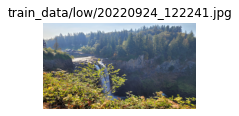

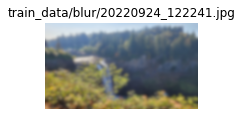

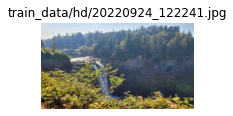

In [20]:
# View a random image from the training dataset

random_set = get_random_image(list=labels_training_data)
print("Random set: ", random_set)

plt.figure()
plt.subplot(1, 2, 1)
img = show_target_image(target_image=random_set[0])

plt.figure()
plt.subplot(1, 2, 1)
img = show_target_image(target_image=random_set[1])

plt.figure()
plt.subplot(1, 2, 1)
img = show_target_image(target_image=random_set[2])

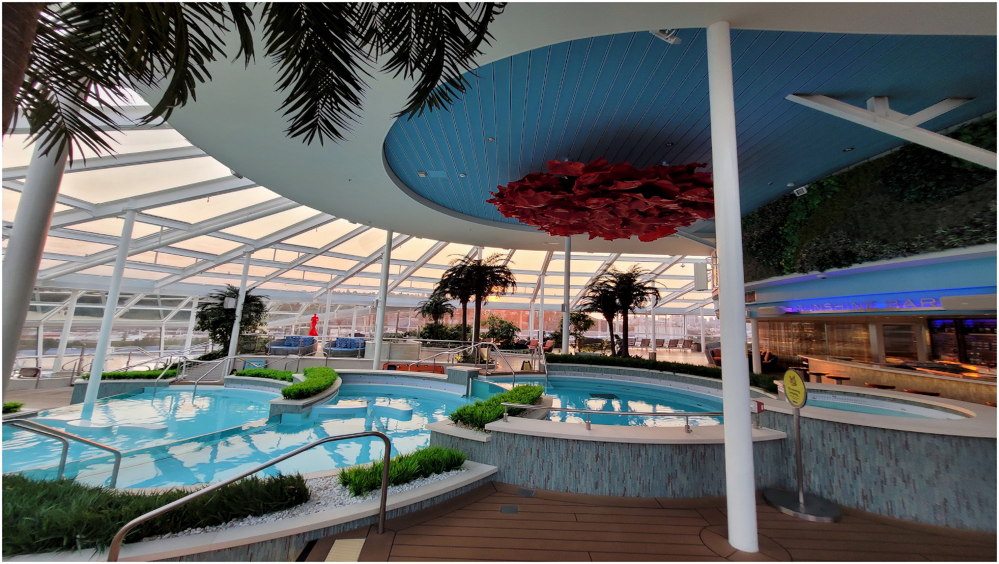

In [21]:
random_set = get_random_image(list=labels_training_data)
img = mpimg.imread(random_set[0]) # read low image data
low_resolution_image = tf.expand_dims(img, axis=0) # Low Resolution Image of shape [batch_size, height, width, 3]

low_resolution_image = tf.cast(low_resolution_image, tf.float32)

super_resolution = model(low_resolution_image) # Perform Super Resolution here
super_resolution = tf.squeeze(super_resolution) / 255.

plt.figure(figsize=(60, 60))
plt.axis("off");
plt.imshow(super_resolution)